In [ ]:
# !pip install -r /kaggle/input/pip-requirements/requirements.txt

In [1]:
!pip install visualkeras

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.8/993.8 kB 17.5 MB/s eta 0:00:00a 0:00:01


In [4]:
import pickle
import visualkeras
from tqdm import tqdm
import numpy as np
import pandas as pd
import skimage
from skimage import io
import tifffile as tifi
from skimage.io import imread_collection
import albumentations as A
from IPython.display import SVG
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from PIL import Image, ImageFont
from collections import defaultdict
import os, re, sys, random, shutil, cv2

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import applications, optimizers
from tensorflow.keras.applications import VGG16, VGG19, DenseNet121, InceptionResNetV2, ResNet50, MobileNetV2
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.utils import model_to_dot, plot_model
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, CSVLogger, LearningRateScheduler

In [5]:
import tensorflow as tf
print(tf.__version__)


2.15.0


# loading data


In [6]:
data_dir = "/kaggle/input/mumbai-image-dataset/Dataset/Prepared_Dataset"

train_images = os.path.join(data_dir, "train_images/")
train_masks = os.path.join(data_dir, "train_masks/")
val_images = os.path.join(data_dir, "val_images/")
val_masks = os.path.join(data_dir, "val_masks/")
test_images = os.path.join(data_dir, "test_images/")
test_masks = os.path.join(data_dir, "test_masks/")


In [7]:
import os
print('Number of images in training set: ', len(os.listdir(train_images+'train')))
print('Number of masks in training set: ', len(os.listdir(train_masks+'train')))
print('Number of images in validation set: ', len(os.listdir(val_images+'valid')))
print('Number of masks in validation set: ', len(os.listdir(val_masks+'valid')))
print('Number of images in testing set: ', len(os.listdir(test_images+'test')))
print('Number of masks in testing set: ', len(os.listdir(test_masks+'test')))

Number of images in training set:  7128
Number of masks in training set:  7128
Number of images in validation set:  891
Number of masks in validation set:  891
Number of images in testing set:  891
Number of masks in testing set:  891


# plotting satellite images vs ground truth images


In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
import cv2

# files = ['tile_6.1_65', 'tile_1.18_15', 'tile_3.7_4', 'tile_1.11_25', 'tile_4.34_74', 'tile_1.12_4', 'tile_3.7_18', 'tile_6.7_8', 'tile_6.19_55']

# def show_data(files, images_dir, masks_dir):
#         fig, axs = plt.subplots(3, 6, figsize=(22, 12), constrained_layout=True)
#         sns.set_style("ticks")
#         fig.suptitle('Training Set Images & Masks\n', fontsize=18, fontweight='medium')
#         idx = 0
#         for i in range(3):
#             for j in range(6):
#                 if j%2 == 0:
#                     axs[i][j].imshow(cv2.resize(cv2.cvtColor(cv2.imread(f'{images_dir}train/{files[idx]}.tif'), cv2.COLOR_BGR2RGB),(128, 128)))
#                     axs[i][j].set_title(f'Satellite Image: {files[idx]}.tif', fontdict = {'fontsize':14, 'fontweight':'medium'})
#                     axs[i][j].grid(False)
#                     axs[i][j].axis(True)
#                 elif j%2 != 0:
#                         axs[i][j].imshow(cv2.resize(cv2.cvtColor(cv2.imread(f'{masks_dir}train/{files[idx]}.png'), cv2.COLOR_BGR2RGB),(128, 128)))
#                         axs[i][j].set_title(f'Ground Truth: {files[idx]}.png', fontdict = {'fontsize':14, 'fontweight':'medium'})
#                         axs[i][j].grid(False)
#                         axs[i][j].axis(True)
#                         idx += 1
                        
#         plt.savefig('/kaggle/working/img1', facecolor= 'w', transparent= False, bbox_inches= 'tight', dpi= 300)
#         plt.show()

# show_data(files, train_images, train_masks)

In [9]:
import pandas as pd
class_df = pd.read_csv('/kaggle/input/mumbai-image-dataset/Dataset/Main_Dataset/class_dict.csv', index_col=False, skipinitialspace=True)
class_df

,name,r,g,b
0,Informal Settlements,250,235,185
1,Built-Up,200,200,200
2,Impervious Surfaces,100,100,150
3,Vegetation,80,140,50
4,Barren,200,160,40
5,Water,40,120,240
6,Unlabelled,0,0,0


In [10]:
import numpy as np
label_names= list(class_df.name)
label_codes = []
r= np.asarray(class_df.r)
g= np.asarray(class_df.g)
b= np.asarray(class_df.b)

for i in range(len(class_df)):
    label_codes.append(tuple([r[i], g[i], b[i]]))
    
label_codes, label_names

([(250, 235, 185),
  (200, 200, 200),
  (100, 100, 150),
  (80, 140, 50),
  (200, 160, 40),
  (40, 120, 240),
  (0, 0, 0)],
 ['Informal Settlements',
  'Built-Up',
  'Impervious Surfaces',
  'Vegetation',
  'Barren',
  'Water',
  'Unlabelled'])

In [11]:
code_to_id = {v:k for k,v in enumerate(label_codes)}
id_to_code = {k:v for k,v in enumerate(label_codes)}

name_to_id = {v:k for k,v in enumerate(label_names)}
id_to_name = {k:v for k,v in enumerate(label_names)}

name_to_code={label_names[i]:label_codes[i] for i in range(len(label_names))}

In [12]:
id_to_code

{0: (250, 235, 185),
 1: (200, 200, 200),
 2: (100, 100, 150),
 3: (80, 140, 50),
 4: (200, 160, 40),
 5: (40, 120, 240),
 6: (0, 0, 0)}

In [13]:
id_to_name

{0: 'Informal Settlements',
 1: 'Built-Up',
 2: 'Impervious Surfaces',
 3: 'Vegetation',
 4: 'Barren',
 5: 'Water',
 6: 'Unlabelled'}

In [13]:
name_to_code

{'Informal Settlements': (250, 235, 185),
 'Built-Up': (200, 200, 200),
 'Impervious Surfaces': (100, 100, 150),
 'Vegetation': (80, 140, 50),
 'Barren': (200, 160, 40),
 'Water': (40, 120, 240),
 'Unlabelled': (0, 0, 0)}

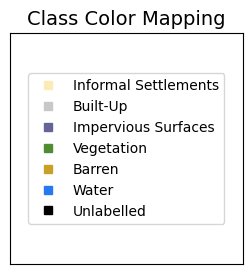

In [14]:

# Create a plot
fig, ax = plt.subplots(figsize=(3, 3))

# Plot each class color
for label, color in name_to_code.items():
    ax.plot([], [], 's', color=[c / 255. for c in color], label=label)

# Add legend
ax.legend(loc='center', fontsize=10)

# Remove ticks and labels
ax.set_xticks([])
ax.set_yticks([])
ax.set_xticklabels([])
ax.set_yticklabels([])

# # Add title
ax.set_title('Class Color Mapping', fontsize=14)

plt.show()

# One hot encoding and decoding


In [15]:
def rgb_to_onehot(rgb_image, color_map = id_to_code):
    '''Function to one hot encode RGB mask labels
        Inputs: 
            rgb_image - image matrix (e.g., 256 x 256 x 3 dimension numpy ndarray)
            color_map - dictionary of color to label id
        Output: One hot encoded image of dimensions (height x width x num_classes) where num_classes = len(color_map)
    '''
    num_classes = len(color_map)
    shape = rgb_image.shape[:2] + (num_classes,)
    encoded_image = np.zeros(shape, dtype=np.float32)
    for i, cls in enumerate(color_map):
        encoded_image[:,:,i] = np.all(rgb_image.reshape((-1, 3)) == color_map[i], axis=1).reshape(shape[:2])
    return encoded_image

def onehot_to_rgb(onehot, color_map = id_to_code):
    '''Function to decode encoded mask labels
        Inputs: 
            onehot - one hot encoded image matrix (height x width x num_classes)
            color_map - dictionary of color to label id
        Output: Decoded RGB image (height x width x 3) 
    '''
    single_layer = np.argmax(onehot, axis=-1)
    output = np.zeros(onehot.shape[:2] + (3,))
    for k in color_map.keys():
        output[single_layer==k] = color_map[k]
    return np.uint8(output)


In [29]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array

# Normalizing only frame images, since masks contain label info
data_gen_args = dict(rescale=1./255)
mask_gen_args = dict()

train_frames_datagen = ImageDataGenerator(**data_gen_args)
train_masks_datagen = ImageDataGenerator(**mask_gen_args)
val_frames_datagen = ImageDataGenerator(**data_gen_args)
val_masks_datagen = ImageDataGenerator(**mask_gen_args)
test_frames_datagen = ImageDataGenerator(**data_gen_args)
test_masks_datagen = ImageDataGenerator(**mask_gen_args)

# Seed defined for aligning images and their masks
seed = 1

# Image data Generators


In [18]:
# data_dir = "Dataset\Prepared_Dataset"

# train_images = os.path.join(data_dir, "train", "images")
# print(train_images)
# train_masks = os.path.join(data_dir, "train", "masks")
# val_images = os.path.join(data_dir, "val", "images")
# val_masks = os.path.join(data_dir, "val", "masks")
# test_images = os.path.join(data_dir, "test", "images")
# test_masks = os.path.join(data_dir, "test", "masks")


In [79]:
def TrainAugmentGenerator(train_images_dir, train_masks_dir, seed = 1, batch_size = 8, target_size = (256, 256)):
    '''Train Image data generator
        Inputs: 
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            train_images_dir - train images directory
            train_masks_dir - train masks directory
            target_size - tuple of integers (height, width)
            
        Output: Decoded RGB image (height x width x 3) 
    '''
    train_image_generator = train_frames_datagen.flow_from_directory(
    train_images_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)

    train_mask_generator = train_masks_datagen.flow_from_directory(
    train_masks_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)

    while True:
        X1i = next(train_image_generator)
        X2i = next(train_mask_generator)


        
        #One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[0][x,:,:,:], id_to_code) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], X2i[0]

def ValAugmentGenerator(val_images_dir, val_masks_dir, seed = 1, batch_size = 8, target_size = (256, 256)):

    '''Validation Image data generator
        Inputs: 
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            val_images_dir - validation images directory
            val_masks_dir - validation masks directory
            target_size - tuple of integers (height, width)
            
        Output: Decoded RGB image (height x width x 3) 
    '''
    val_image_generator = val_frames_datagen.flow_from_directory(
    val_images_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    val_mask_generator = val_masks_datagen.flow_from_directory(
    val_masks_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    while True:
        X1i = next(val_image_generator)
        X2i = next(val_mask_generator)


        
        #One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[0][x,:,:,:], id_to_code) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], X2i[0]
        
def TestAugmentGenerator(test_images_dir, test_masks_dir, seed = 1, batch_size = 8, target_size = (256,256)):
    '''Validation Image data generator
        Inputs: 
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            test_images_dir - testing images directory
            test_masks_dir - testing masks directory
            target_size - tuple of integers (height, width)
            
        Output: Decoded RGB image (height x width x 3) 
    '''
    test_image_generator = test_frames_datagen.flow_from_directory(
    test_images_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    test_mask_generator = test_masks_datagen.flow_from_directory(
    test_masks_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    while True:
        X1i = next(test_image_generator)
        X2i = next(test_mask_generator)


        
        #One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[0][x,:,:,:], id_to_code) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], X2i[0]

# GAN

In [21]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, BatchNormalization, LeakyReLU, Activation, Concatenate, Conv2DTranspose, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.layers import Layer
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, BatchNormalization, LeakyReLU, Activation, Concatenate, Conv2DTranspose, Input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import ZeroPadding2D
# # Custom LeakyReLU layer
# class LeakyReLU(Layer):
#     def call(self, inputs):
#         return tf.nn.leaky_relu(inputs)

OUTPUT_CHANNELS = 3

def downsample(filters, size, apply_batchnorm=True):
    '''performs a downsampling of the input image by applying a CONV2D layer with stride of 2'''
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    
    result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

    result.add(tf.keras.layers.LeakyReLU())

    return result
def upsample(filters, size, apply_dropout=False):
    '''performs a upsampling of the input image by applying a CONV2DTranspose layer with stride of 2'''

    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

    result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:    
        result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())

    return result
def Generator():
    '''a UNET generator'''
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])

    down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
    ]

    up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    
    #list to store skip connections
    skips = []
    
    
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        
        #skip connection from the downsampling
        x = tf.keras.layers.Concatenate()([x, skip])

    out = last(x)

    return tf.keras.Model(inputs=inputs, outputs=out)

def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

    x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

    down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
    down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
    down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

    return tf.keras.Model(inputs=[inp, tar], outputs=last)


discriminator = Discriminator()
generator = Generator()

# #plot a sample output
# gen_output = generator(img[tf.newaxis,:,:256,:], training=False)
# plt.figure(figsize=(8,8))
# plt.imshow(gen_output.numpy().squeeze())
# plt.title('Untrained Generator output')

# plt.axis('off')
# plt.show()
# # Instantiate Generator and Discriminator
# generator = build_generator(shape = (256, 256, 3), num_classes = 7)
# discriminator = build_discriminator(shape = (256, 256, 10))

# Display model summary
generator.summary()
discriminator.summary()


Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_3        │ (None, 128, 128,  │      3,072 │ input_layer_3[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_4        │ (None, 64, 64,    │    131,584 │ sequential_3[0][… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_5        │ (None, 32, 32,    │    525,312 │ sequential_4[0][… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_6        │ (None, 16, 16,    │  2,099,200 │ sequential_5[0][… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_7        │ (None, 8, 8, 512) │  4,196,352 │ sequential_6[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_8        │ (None, 4, 4, 512) │  4,196,352 │ sequential_7[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_9        │ (None, 2, 2, 512) │  4,196,352 │ sequential_8[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_10       │ (None, 1, 1, 512) │  4,196,352 │ sequential_9[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_11       │ (None, 2, 2, 512) │  4,196,352 │ sequential_10[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 2, 2,      │          0 │ sequential_11[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_9[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_12       │ (None, 4, 4, 512) │  8,390,656 │ concatenate_1[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 4, 4,      │          0 │ sequential_12[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_8[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_13       │ (None, 8, 8, 512) │  8,390,656 │ concatenate_2[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 8, 8,      │          0 │ sequential_13[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_7[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_14       │ (None, 16, 16,    │  8,390,656 │ concatenate_3[0]… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_4       │ (None, 16, 16,    │          0 │ sequential_14[0]

 Total params: 54,425,859 (207.62 MB)

 Trainable params: 54,414,979 (207.58 MB)

 Non-trainable params: 10,880 (42.50 KB)

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_image         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ target_image        │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 256, 256,  │          0 │ input_image[0][0… │
│ (Concatenate)       │ 6)                │            │ target_image[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential          │ (None, 128, 128,  │      6,144 │ concatenate[0][0] │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_1        │ (None, 64, 64,    │    131,584 │ sequential[0][0]  │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_2        │ (None, 32, 32,    │    525,312 │ sequential_1[0][… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 34, 34,    │          0 │ sequential_2[0][… │
│ (ZeroPadding2D)     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 31, 31,    │  2,097,152 │ zero_padding2d[0… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 31, 31,    │      2,048 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_3       │ (None, 31, 31,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 33, 33,    │          0 │ leaky_re_lu_3[0]… │
│ (ZeroPadding2D)     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 30, 30, 1) │      8,193 │ zero_padding2d_1… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 2,770,433 (10.57 MB)

 Trainable params: 2,768,641 (10.56 MB)

 Non-trainable params: 1,792 (7.00 KB)

In [18]:
#Generator and discriminator optimizers
g_opt = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
d_opt = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [22]:
from tensorflow.keras.losses import categorical_crossentropy
LAMBDA = 0.1
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def g_loss(disc_generated_output, gen_output, target):
    '''generator loss with the lambda param'''
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

    # Mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss
def d_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss




In [80]:
from tensorflow.keras.models import Model
from tensorflow.keras.models import Model
import tensorflow.keras.backend as K
import numpy as np

def dice_coef_calc(target, output):

    y_true=target
    y_pred=output
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    intersection = K.sum(y_true * y_pred)
    return ((2. * intersection) / (K.sum(y_true) + K.sum(y_pred))) - 1.1

def compute_accuracy(y_true, y_pred):
    # Compute accuracy
    correct_predictions = tf.reduce_sum(tf.cast(tf.equal(tf.argmax(y_true, axis=-1), tf.argmax(y_pred, axis=-1)), tf.float32))
    total_pixels = tf.cast(tf.size(y_true), tf.float32)
    accuracy = correct_predictions / total_pixels
    return accuracy
class SATGAN(Model):
    def __init__(self, generator, discriminator, *args, **kwargs):
        # Pass through args and kwargs to the base class
        super().__init__(*args, **kwargs)

        # Create attributes for generator and discriminator models
        self.generator = generator
        self.discriminator = discriminator

    def compile(self, g_opt, d_opt, g_loss, d_loss, *args, **kwargs):
        # Compile with the base class
        super().compile(*args, **kwargs)
        print('compiling model')
        # Create attributes for optimizers and loss functions
        self.g_opt = g_opt
        self.d_opt = d_opt
        self.g_loss = g_loss
        self.d_loss = d_loss
        self.loss = None
        
    def call(self, input_image):
        # Generate output image from input
        gen_output = self.generator(input_image)



        # Pass concatenated input and target to the discriminator
        disc_output = self.discriminator([input_image, gen_output])

        return gen_output, disc_output

    def train_step(self, batch):
        # Get the data for real images
        input_image, target = batch

        with tf.GradientTape(persistent=True) as gen_tape, tf.GradientTape(persistent=True) as disc_tape:
            gen_output = self.generator(input_image)
            disc_real_output = self.discriminator([input_image, target])
            disc_generated_output = self.discriminator([input_image, gen_output])
            gen_loss = self.g_loss(disc_generated_output, gen_output, target)
            disc_loss = self.d_loss(disc_real_output, disc_generated_output)


            dice_coef = dice_coef_calc(target, gen_output)

            # Compute accuracy
            accuracy = compute_accuracy(target, gen_output)
            total_loss=gen_loss+disc_loss

        dgrad = disc_tape.gradient(disc_loss, self.discriminator.trainable_variables)
        self.d_opt.apply_gradients(zip(dgrad, self.discriminator.trainable_variables))
        ggrad = gen_tape.gradient(gen_loss, self.generator.trainable_variables)
        self.g_opt.apply_gradients(zip(ggrad, self.generator.trainable_variables))

        return {"d_loss": disc_loss, "g_loss": gen_loss, "dice_coefficient": dice_coef, "accuracy": accuracy,"total_loss":total_loss}


# Create an instance of the FashionGAN model
satgan = SATGAN(generator, discriminator)
loss = tf.keras.losses.CategoricalCrossentropy()
# Compile the model with the optimizers and loss functions
satgan.compile(g_opt, d_opt, g_loss, d_loss, loss=loss)



compiling model


In [24]:
batch_size = 32
num_train_samples = len(np.sort(os.listdir(train_images+'train')))
num_val_samples = len(np.sort(os.listdir(val_images+'valid')))
steps_per_epoch = int(np.ceil(float(num_train_samples) / float(batch_size)))
print('steps_per_epoch: ', steps_per_epoch)
validation_steps = int(np.ceil(float(num_val_samples) / (float(batch_size))))
print('validation_steps: ', validation_steps)


steps_per_epoch:  223
validation_steps:  28


In [25]:
import tensorflow.keras.backend as K

def class_accuracy(confusion: np.ndarray) -> np.ndarray:
    """
    Return the per class accuracy from confusion matrix.
    Args:
        confusion: the confusion matrix between ground truth and predictions
    Returns:
        a vector representing the per class accuracy
    """
    # extract the number of correct guesses from the diagonal
    preds_correct = np.sum(confusion * np.eye(len(confusion)), axis=-1)
    # extract the number of total values per class from ground truth
    trues = np.sum(confusion, axis=-1)
    # get per class accuracy by dividing correct by total
    return preds_correct / trues

def iou(confusion: np.ndarray) -> np.ndarray:
    """
    Return the per class Intersection over Union (I/U) from confusion matrix.
    Args:
        confusion: the confusion matrix between ground truth and predictions
    Returns:
        a vector representing the per class I/U
    """
    # get |intersection| (AND) from the diagonal of the confusion matrix
    intersection = (confusion * np.eye(len(confusion))).sum(axis=-1)
    # calculate the total ground truths and predictions per class
    preds = confusion.sum(axis=0)
    trues = confusion.sum(axis=-1)
    # get |union| (OR) from the predictions, ground truths, and intersection
    union = trues + preds - intersection
    # return the intersection over the union
    return intersection / union

In [27]:
print(type(satgan))

<class '__main__.SATGAN'>


In [28]:
satgan.optimizer.get_config()



{'name': 'rmsprop',
 'learning_rate': 0.0010000000474974513,
 'weight_decay': None,
 'clipnorm': None,
 'global_clipnorm': None,
 'clipvalue': None,
 'use_ema': False,
 'ema_momentum': 0.99,
 'ema_overwrite_frequency': 100,
 'loss_scale_factor': None,
 'gradient_accumulation_steps': None,
 'rho': 0.9,
 'momentum': 0.0,
 'epsilon': 1e-07,
 'centered': False}

In [26]:
def exponential_decay(lr0, s):
    def exponential_decay_fn(epoch):
        return lr0 * 0.1 **(epoch / s)
    return exponential_decay_fn

exponential_decay_fn = exponential_decay(0.0001, 40)

lr_scheduler = LearningRateScheduler(
    exponential_decay_fn,
    verbose=1
)

checkpoint = ModelCheckpoint(
    filepath = './output/sat.keras',
    save_best_only = True, 
#     save_weights_only = False,
    monitor = 'val_loss', 
    mode = 'auto', 
    verbose = 1
)

# earlystop = EarlyStopping(
#     monitor = 'val_loss', 
#     min_delta = 0.001, 
#     patience = 10, 
#     mode = 'auto', 
#     verbose = 1,
#     restore_best_weights = True
# )
class LearningRateLogger(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        logs['lr'] = self.model.optimizer.learning_rate.numpy()

import os
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.callbacks import Callback


lr_logger = LearningRateLogger()

# Add the custom callback to the list of callbacks
callbacks = [checkpoint, lr_scheduler, lr_logger]





In [30]:
import tensorflow as tf
print("Num GPUs Available:", len(tf.config.experimental.list_physical_devices('GPU')))


Num GPUs Available: 1


In [27]:
import os

file_path = "/kaggle/working/output/satgan.keras"

if os.path.exists(file_path):
    os.remove(file_path)
    print(f"File {file_path} deleted successfully.")
else:
    print(f"File {file_path} does not exist.")


File /kaggle/working/output/satgan.keras does not exist.


In [61]:
tf.config.run_functions_eagerly(True)

In [81]:
# Instantiate generators
train_generator = TrainAugmentGenerator(train_images_dir=train_images, train_masks_dir=train_masks, target_size=(256, 256))
val_generator = ValAugmentGenerator(val_images_dir=val_images, val_masks_dir=val_masks, target_size=(256,256))

# Fit the model using generators
hist = satgan.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    validation_data=val_generator,
    validation_steps=validation_steps,
    epochs=50,
    callbacks=callbacks,
    verbose=1
)


Found 7128 images belonging to 1 classes.
Found 7128 images belonging to 1 classes.

Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/50
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step - accuracy: 0.8854 - d_loss: 1.1117e-04 - dice_coefficient: 0.8856 - g_loss: 13846.2090 - total_loss: 13846.2090Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.

Epoch 1: val_loss did not improve from 0.20329
223/223 ━━━━━━━━━━━━━━━━━━━━ 57s 205ms/step - accuracy: 0.8854 - d_loss: 1.1117e-04 - dice_coefficient: 0.8856 - g_loss: 13846.2090 - total_loss: 13846.2090 - loss: 0.0000e+00 - val_loss: 484.3694 - learning_rate: 1.0000e-04 - lr: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.440608762859235e-05.
Epoch 2/50
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - accuracy: 0.8808 - d_loss: 6.9251e-05 - dice_coefficient: 0.8857 - g_loss: 13829.0244 - total_loss: 13829.0244
Epoch 2: val_loss did not improve from 0.20329
223/223 ━━━━━━━━━━━

In [92]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

# Evaluating SATGAN Model on Test Set


In [68]:
testing_gen = TestAugmentGenerator(test_images_dir = test_images, test_masks_dir = test_masks, batch_size = 32, target_size = (256,256))
satgan.load_weights("/kaggle/working/output/deeplabv3plus.keras")
satgan_eval = satgan.evaluate(testing_gen, steps=21, return_dict=True)


Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 261ms/step - accuracy: 0.8581 - dice_coef: 0.8277 - loss: 0.4297


In [71]:
Y_true_all_1, y_pred_all_1 = np.array([]), np.array([])
count = 0

for i in range(21):
    batch_img, batch_mask = next(testing_gen)
    pred_all= satgan.predict(batch_img)
    
    for j in range(0,np.shape(pred_all)[0]):
        count += 1
        true_msk = batch_mask[j]
        pred_msk = pred_all[j]
        Y_true = np.argmax(true_msk, axis=-1) # Convert one-hot to index
        y_pred = np.argmax(pred_msk, axis=-1) # Convert one-hot to index

        Y_true_flat = Y_true.flatten()
        y_pred_flat = y_pred.flatten()
            
        Y_true_all_1 = np.append(Y_true_all_1, Y_true_flat)
        y_pred_all_1 = np.append(y_pred_all_1, y_pred_flat)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


2024-03-27 07:50:47.504805: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[256,8748,1,1]{3,2,1,0}, u8[0]{0}) custom-call(f32[1024,8748,3,3]{3,2,1,0}, f32[1024,256,3,3]{3,2,1,0}), window={size=1x1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-03-27 07:50:47.764485: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.259799119s
Trying algorithm eng0{} for conv (f32[256,8748,1,1]{3,2,1,0}, u8[0]{0}) custom-call(f32[1024,8748,3,3]{3,2,1,0}, f32[1024,256,3,3]{3,2,1,0}), window={size=1x1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-03-27 07:50:51.236514: E external/local_xla/xla/servic

1/1 ━━━━━━━━━━━━━━━━━━━━ 20s 20s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


In [72]:
print(Y_true_all_1.shape, y_pred_all_1.shape)
print(classification_report(Y_true_all_1, y_pred_all_1))

(10928128,) (10928128,)


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         0.0       0.97      0.78      0.86   1196143
         1.0       0.98      0.41      0.58    854617
         2.0       0.90      0.81      0.85   1758942
         3.0       0.96      0.78      0.86   2143397
         4.0       0.63      0.99      0.77   1938136
         5.0       0.93      1.00      0.97   3036876
         6.0       0.00      0.00      0.00        17

    accuracy                           0.85  10928128
   macro avg       0.77      0.68      0.70  10928128
weighted avg       0.89      0.85      0.85  10928128



/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [73]:
print('Accuracy:', accuracy_score(Y_true_all_1, y_pred_all_1))
print('Precision:', precision_score(Y_true_all_1, y_pred_all_1, average='weighted'))
print('Recall:', recall_score(Y_true_all_1, y_pred_all_1, average='weighted'))
print('F1 Score:', f1_score(Y_true_all_1, y_pred_all_1, average='weighted'))

Accuracy: 0.8536935145708395


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision: 0.8873967071835996
Recall: 0.8536935145708395
F1 Score: 0.8506413584364634


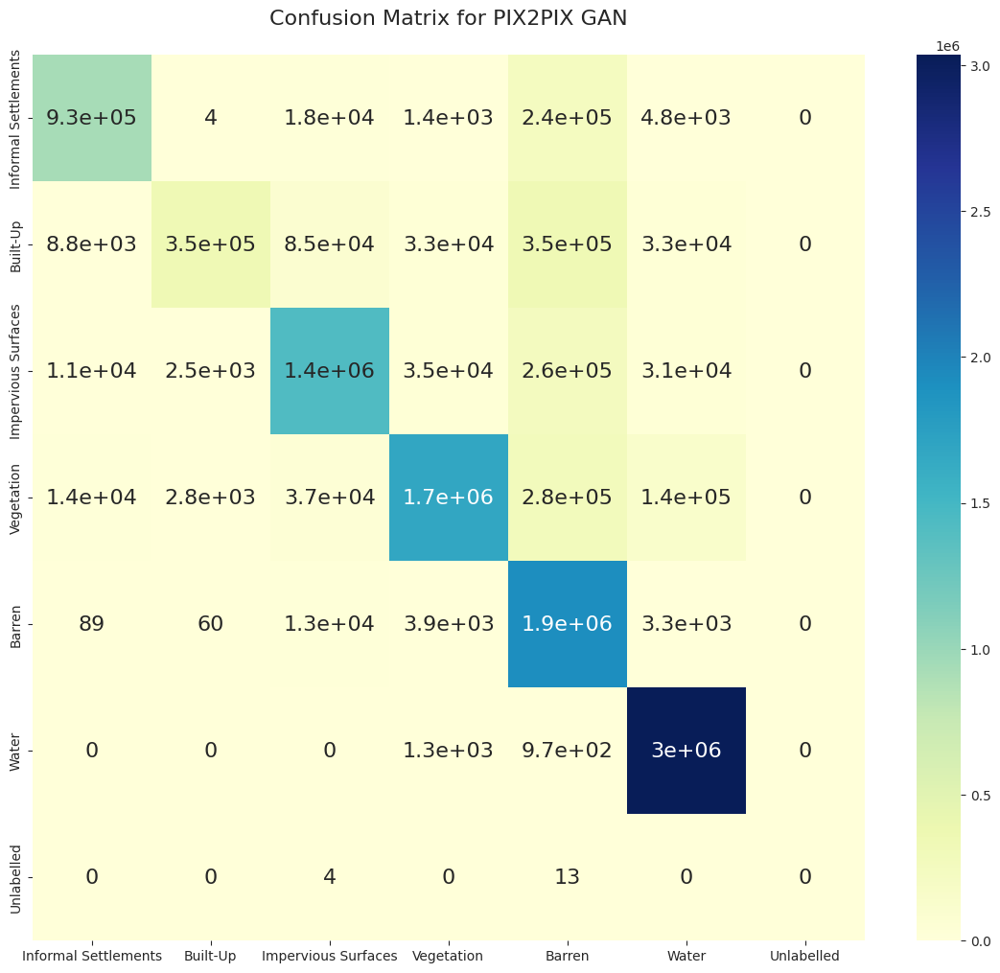

In [74]:
cm_1 = confusion_matrix(Y_true_all_1, y_pred_all_1)
df_cm_1 = pd.DataFrame(cm_1, label_names, label_names)
fig, ax = plt.subplots(figsize=(14,12))
# sns.set(font_scale=1.4) # for label size
sns.heatmap(df_cm_1, annot=True, annot_kws={"size": 16}, cmap=plt.cm.YlGnBu)
plt.title('Confusion Matrix for PIX2PIX GAN\n', fontsize=16)
plt.savefig('/kaggle/working/confusion_matrix_1.png', transparent= False, bbox_inches= 'tight', dpi= 300)
plt.show()

In [75]:
per_class_iou_1 = iou(cm_1)
per_class_iou_1


array([0.75671812, 0.40580467, 0.74508375, 0.7540492 , 0.62730416,
       0.933807  , 0.        ])

In [76]:
per_class_acc_1 = class_accuracy(cm_1)
per_class_acc_1

array([0.77794545, 0.40837592, 0.80988742, 0.78045784, 0.98948474,
       0.99925087, 0.        ])

In [77]:
satgan_acc = pd.DataFrame(zip(label_names, per_class_acc_1[:6].T), columns=['Class', 'Accuracy'])
satgan_class_acc['F1'] = f1_score(Y_true_all_1, y_pred_all_1, average=None)[:6]
satgan_class_acc

,Class,Accuracy,F1
0,Informal Settlements,0.777945,0.861513
1,Built-Up,0.408376,0.577327
2,Impervious Surfaces,0.809887,0.853923
3,Vegetation,0.780458,0.859781
4,Barren,0.989485,0.770973
5,Water,0.999251,0.965771


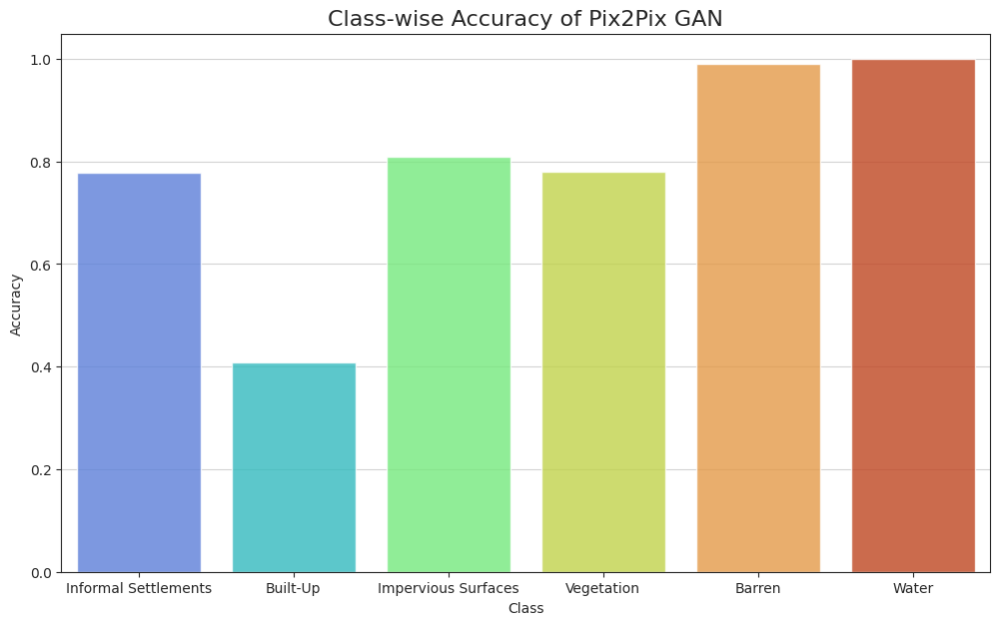

In [78]:
plt.figure(figsize=(12, 7))
plt.title('Class-wise Accuracy of Pix2Pix GAN', fontsize=16)
sns.set_style("ticks")
sns.barplot(x="Class", y="Accuracy", data=satgan_class_acc, palette='turbo', alpha = 0.8)
plt.grid(axis='y', color = 'lightgray', linestyle='-', linewidth=0.8)
plt.savefig('/kaggle/working/deeplabv3plus_class_acc.png', facecolor= 'w', transparent= False, bbox_inches= 'tight', dpi= 300)
plt.show()

# Predictions on Test Set Using PIx2Pix GAN Model


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


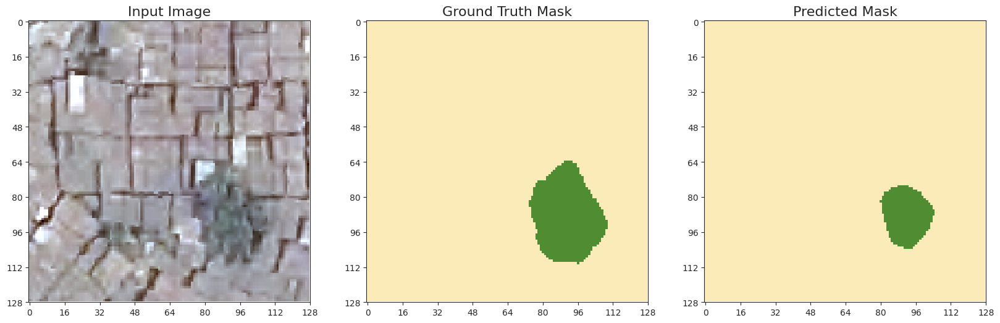

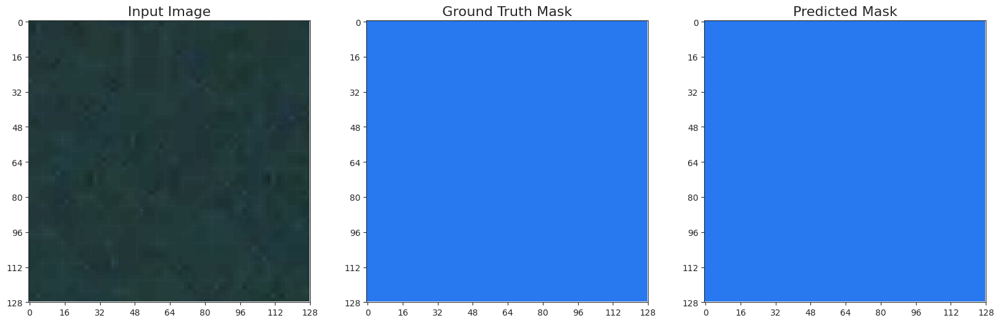

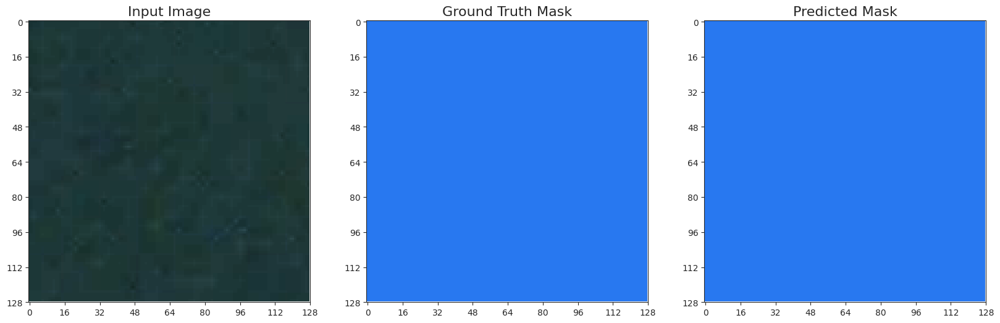

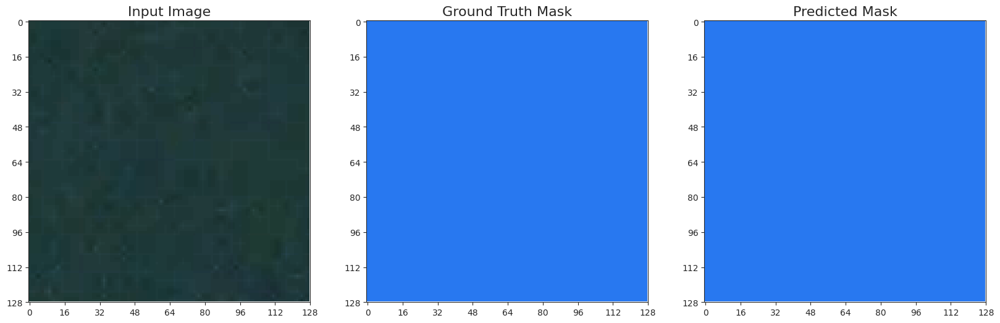

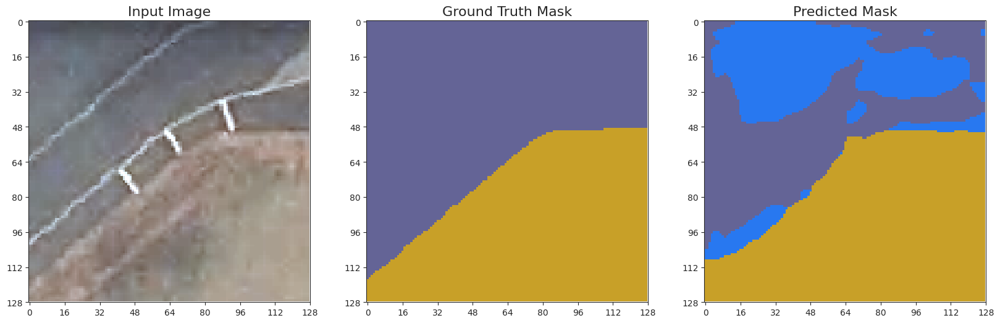

...

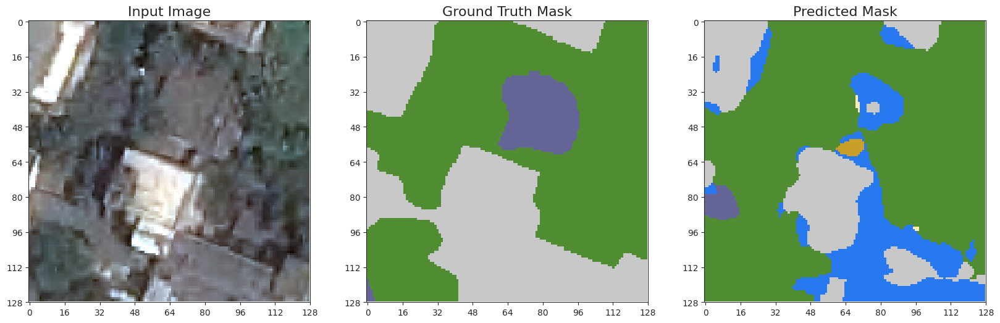

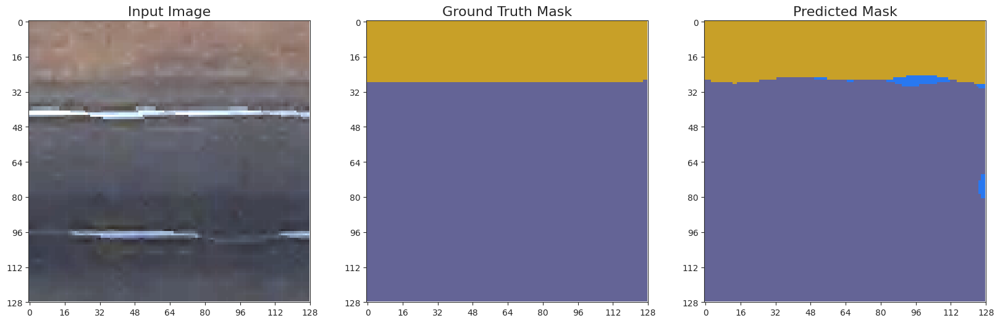

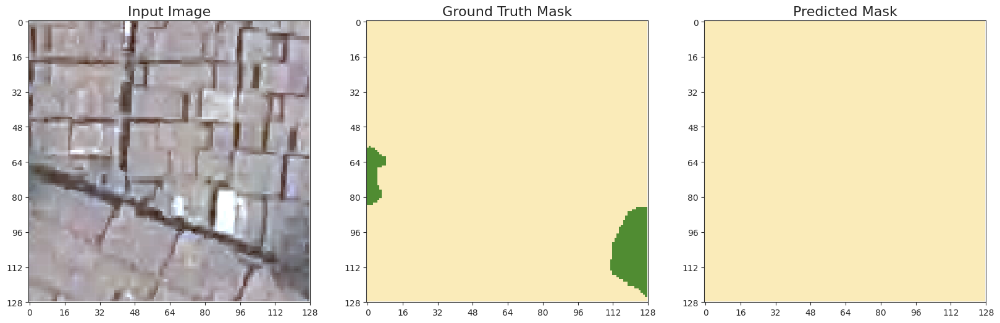

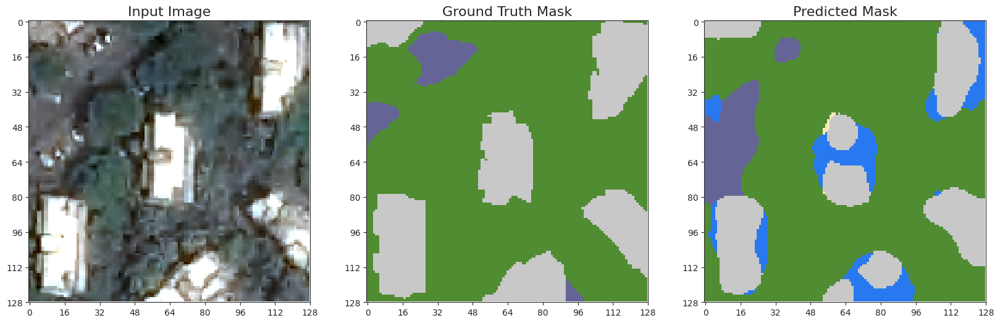

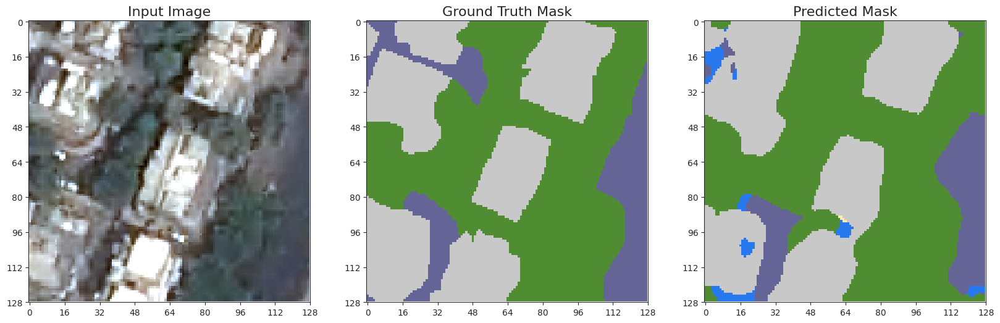

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


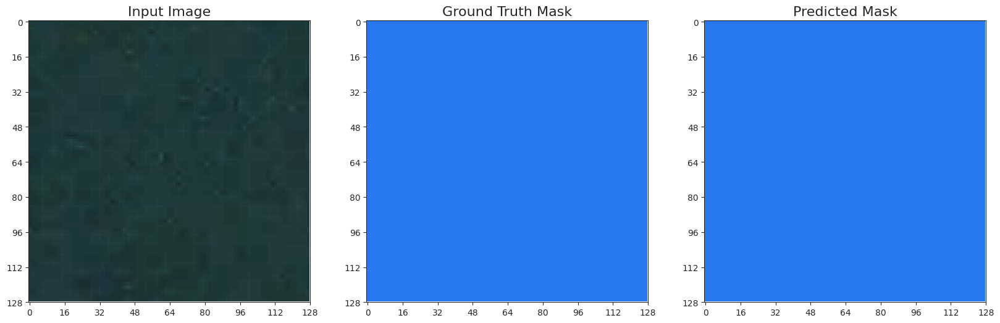

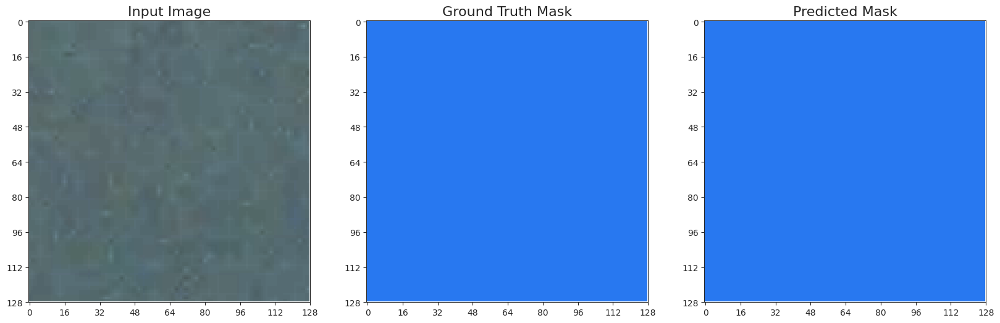

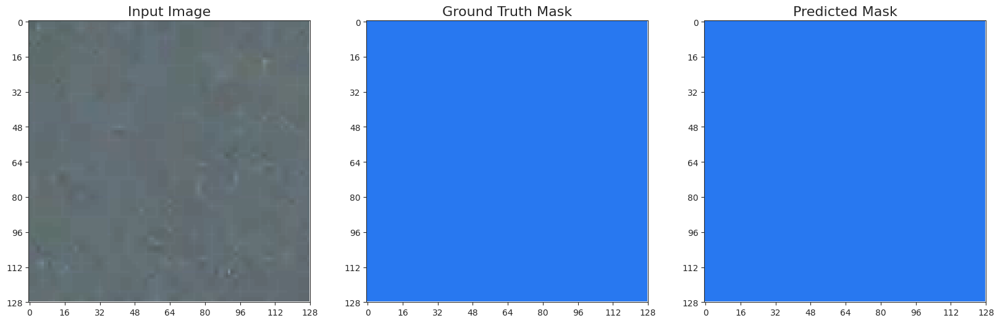

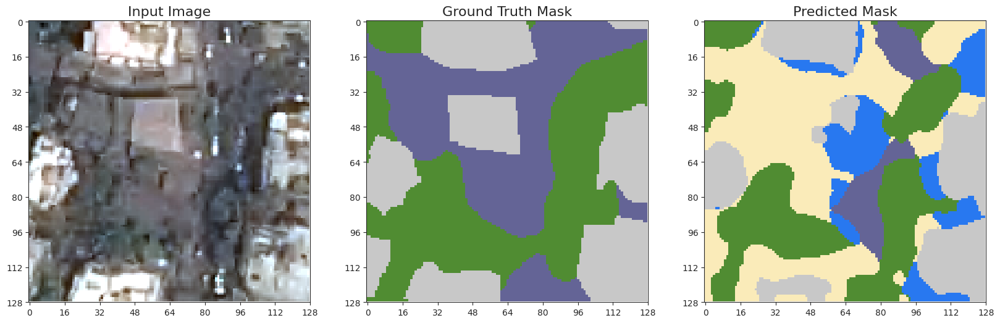

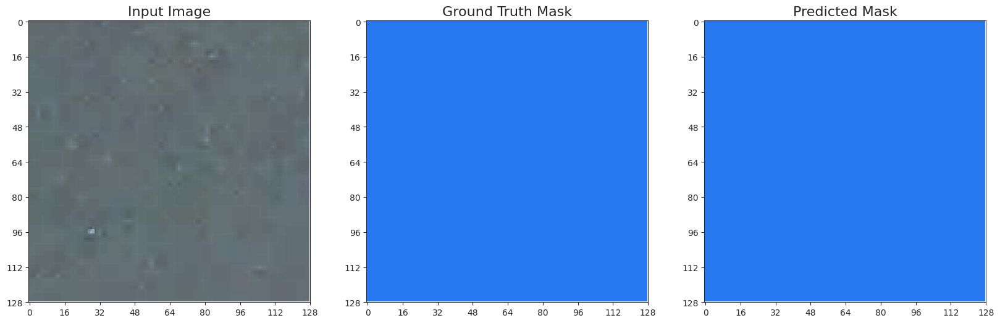

...

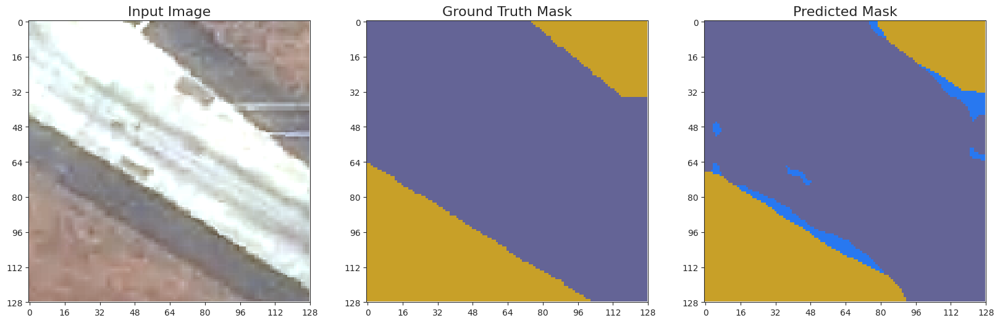

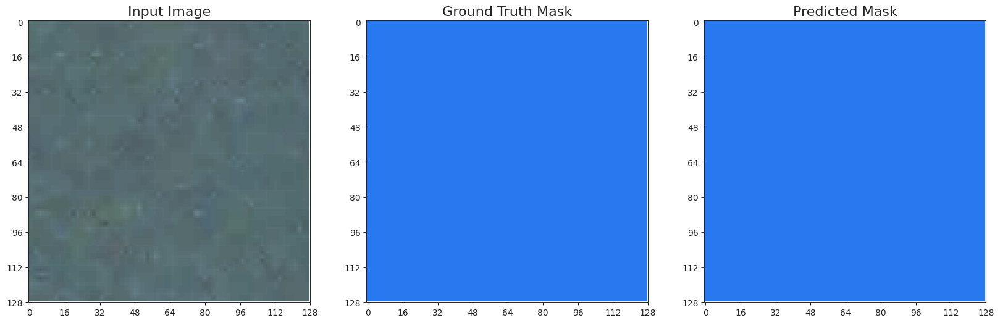

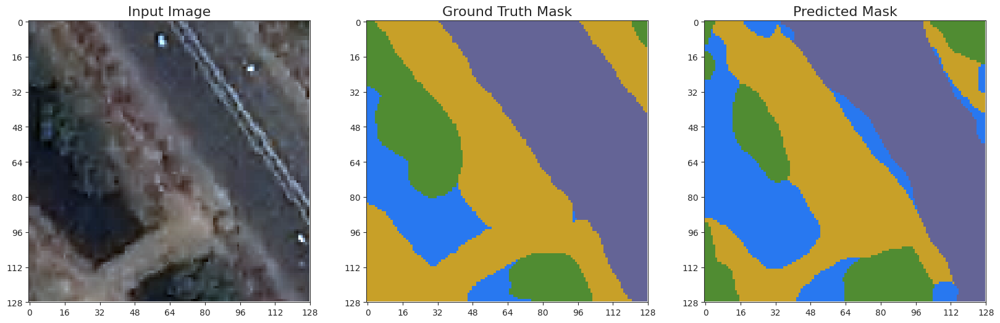

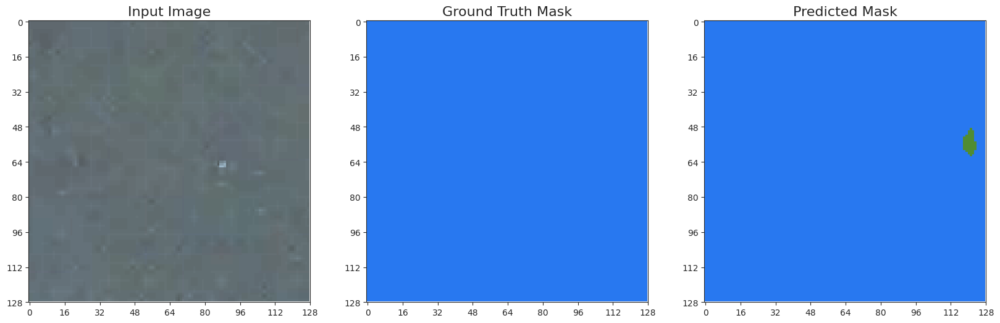

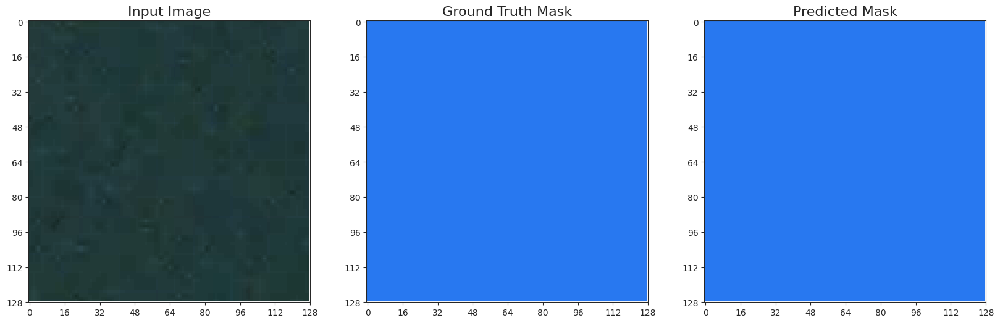

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


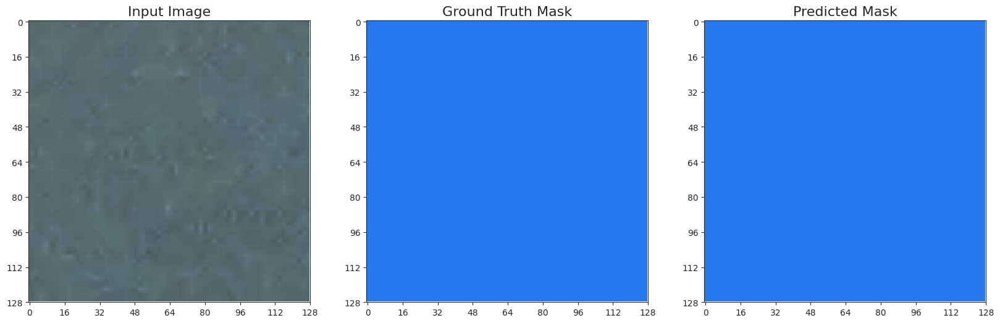

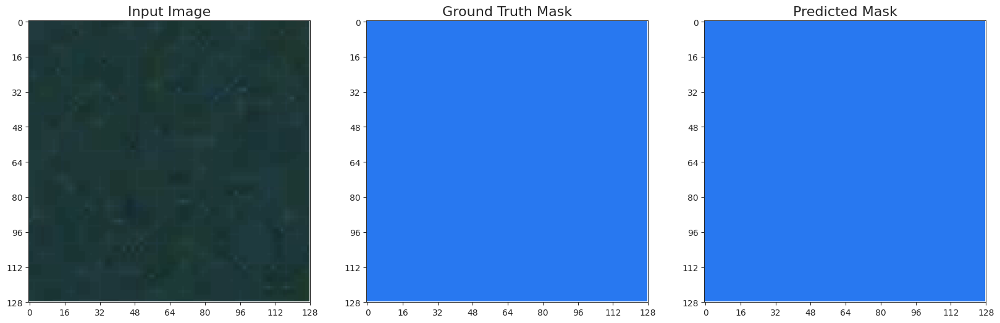

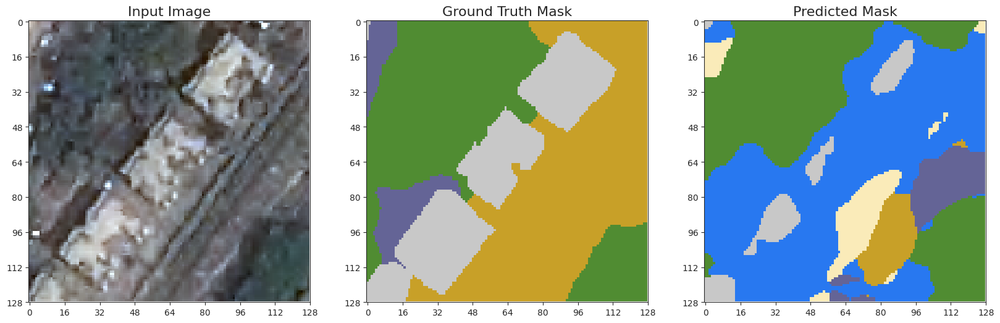

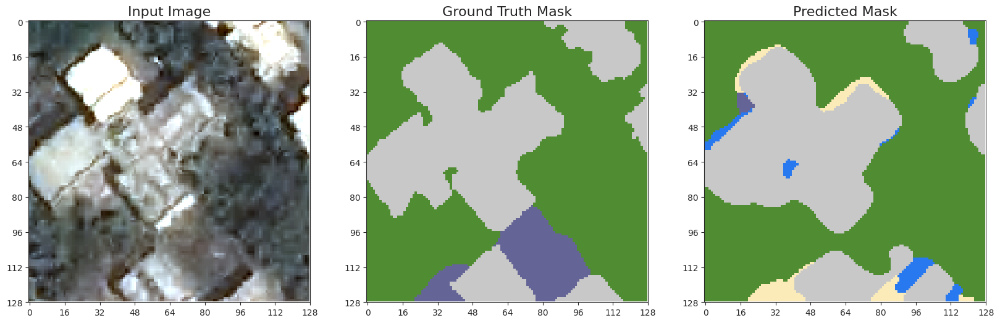

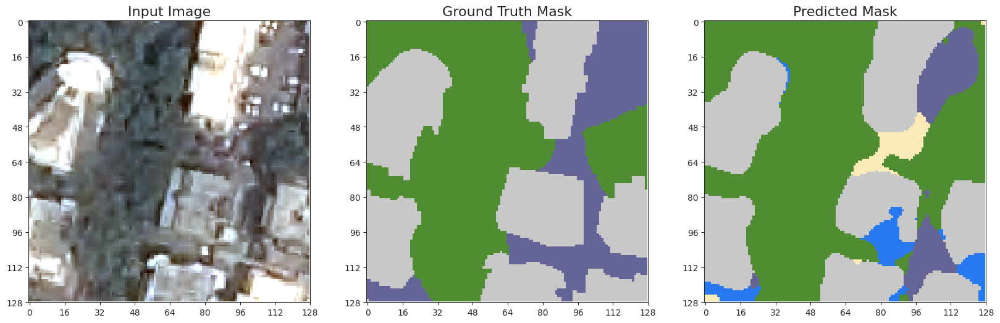

...

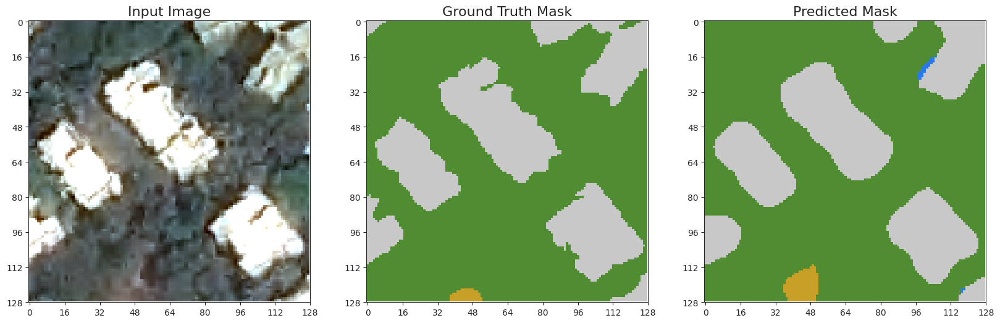

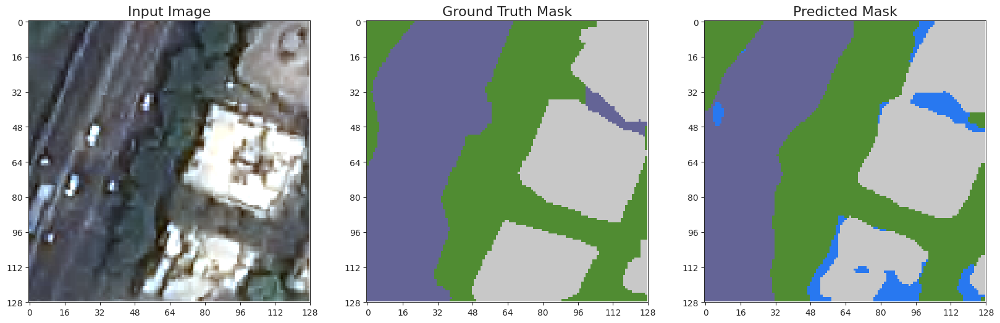

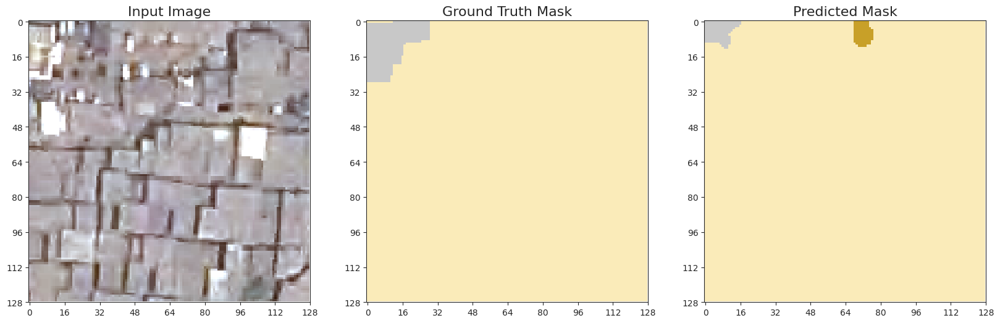

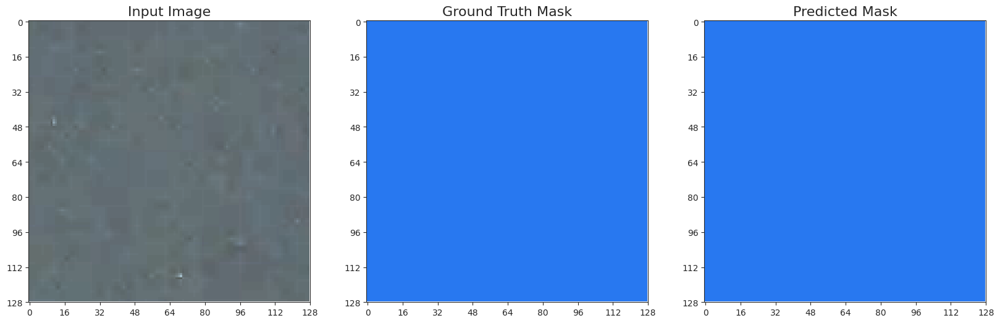

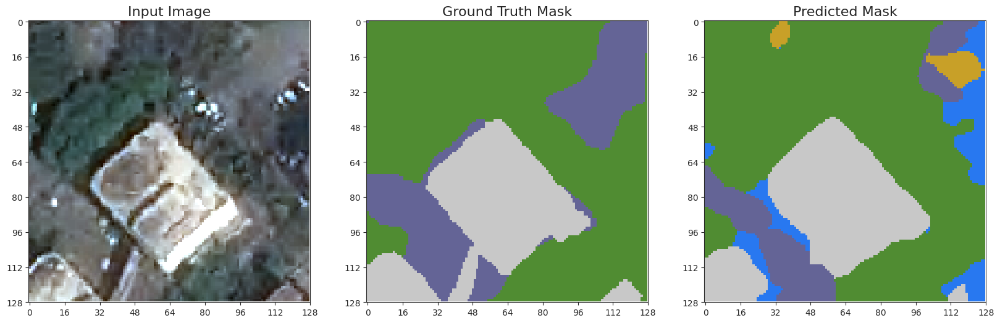

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


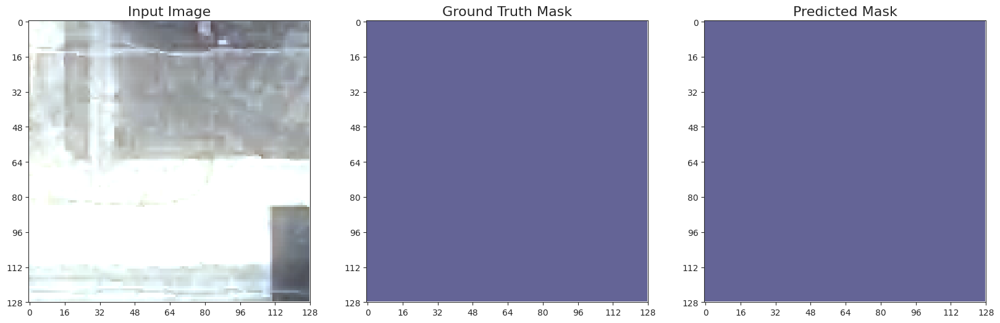

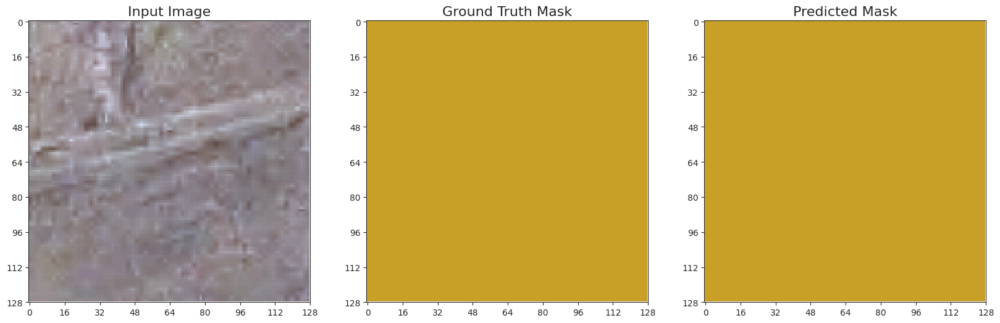

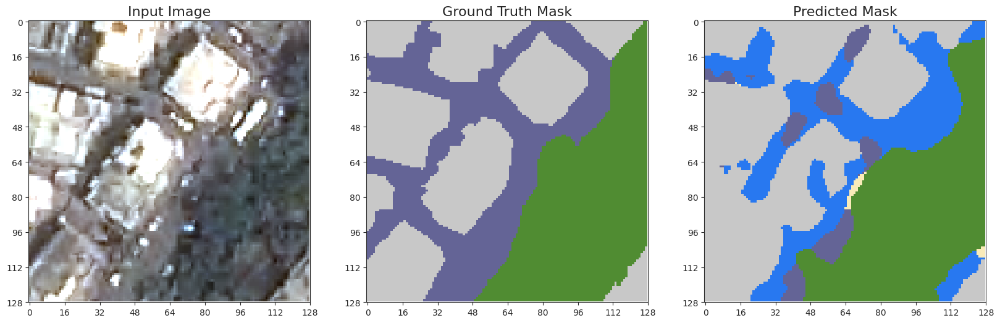

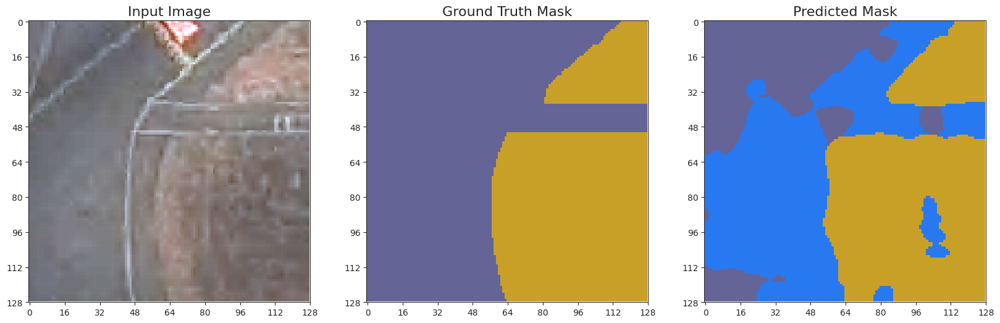

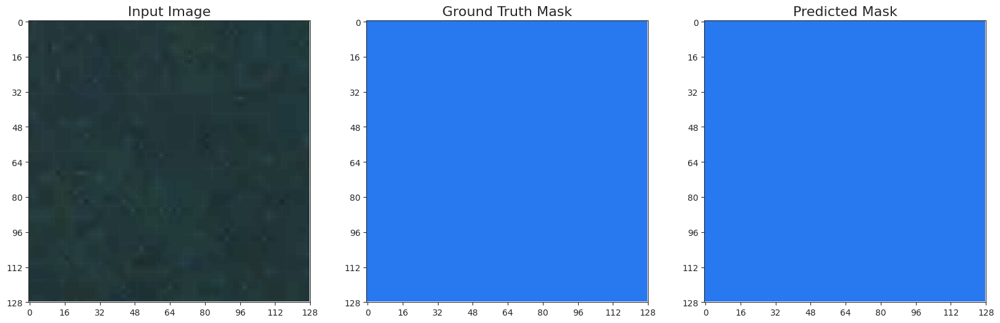

...

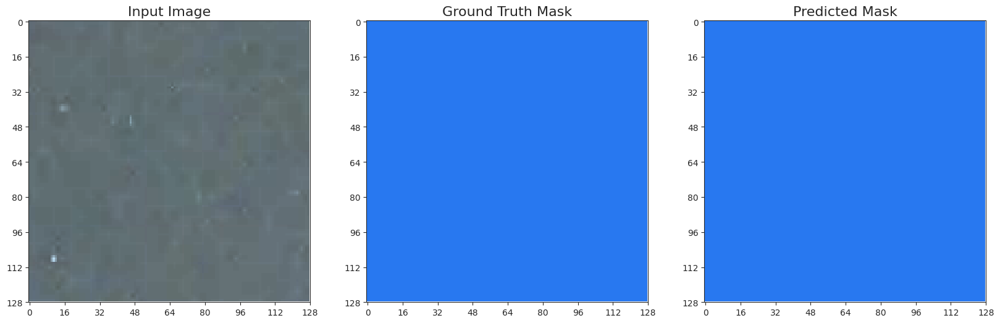

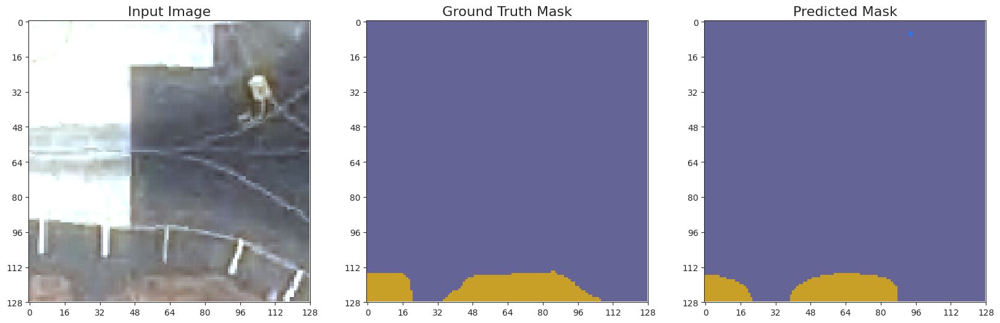

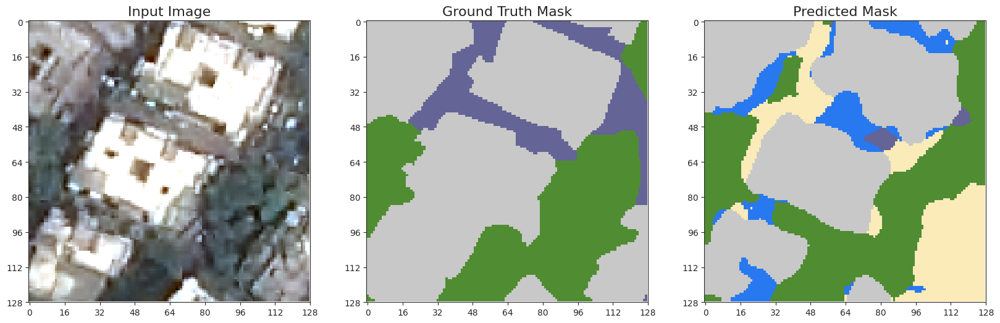

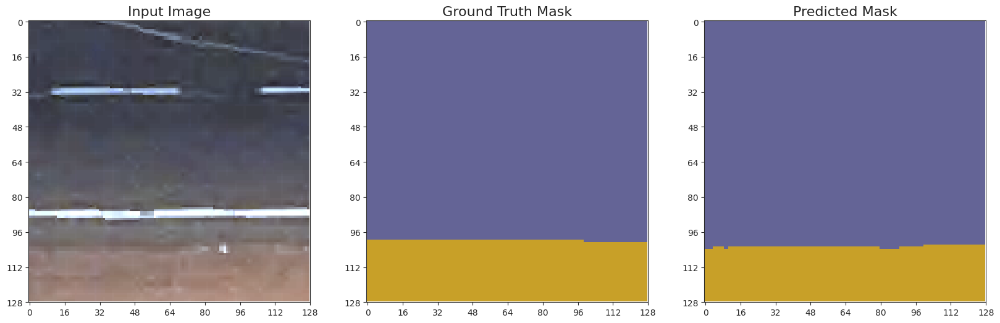

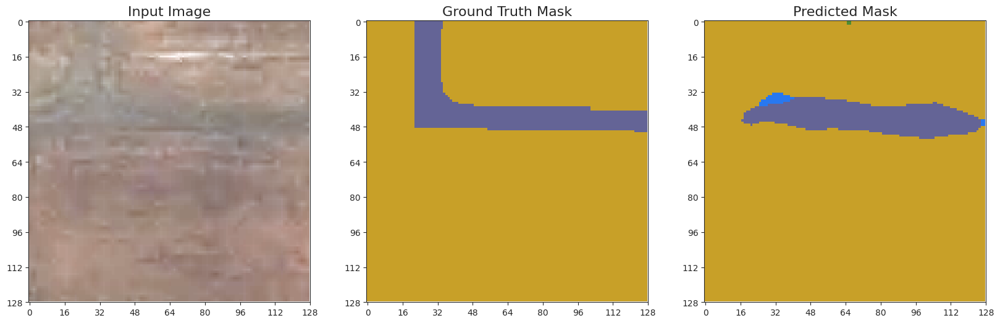

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


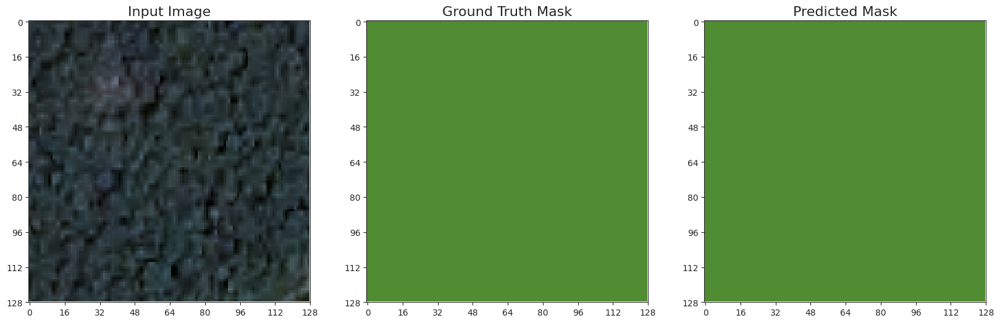

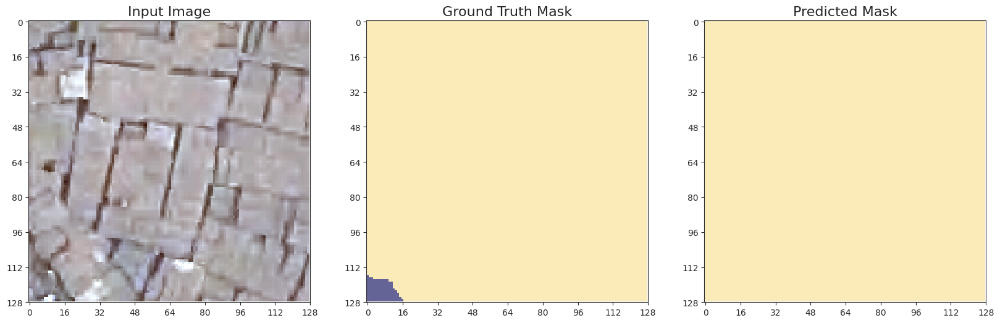

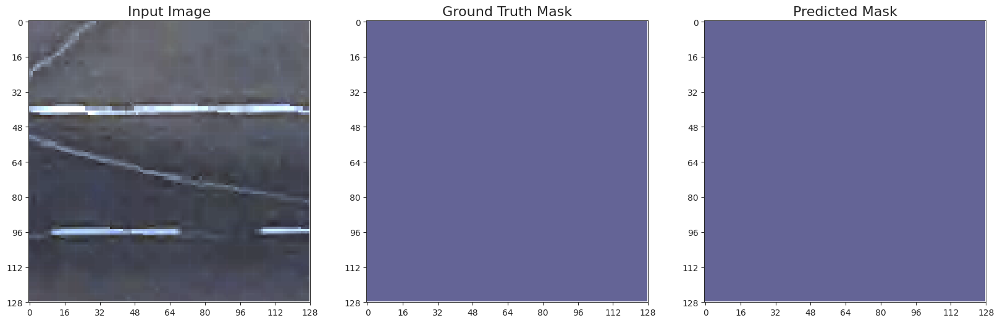

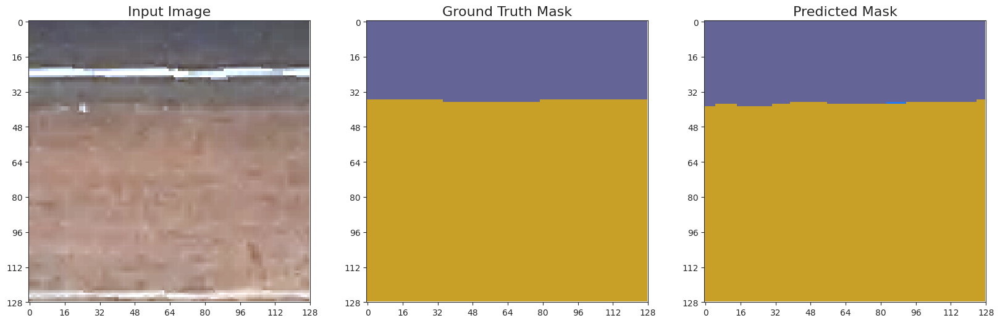

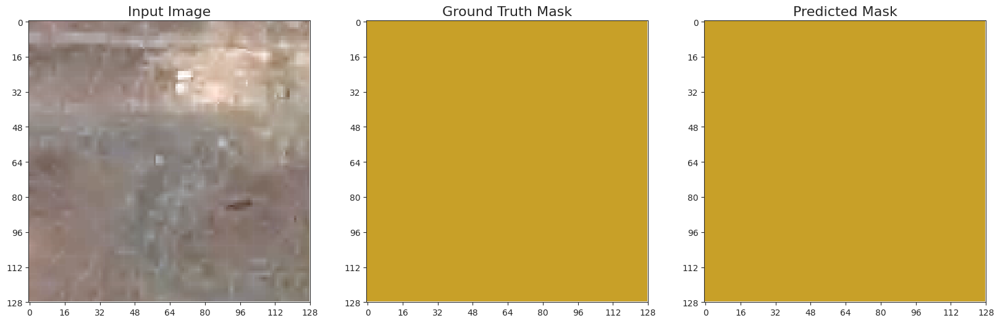

...

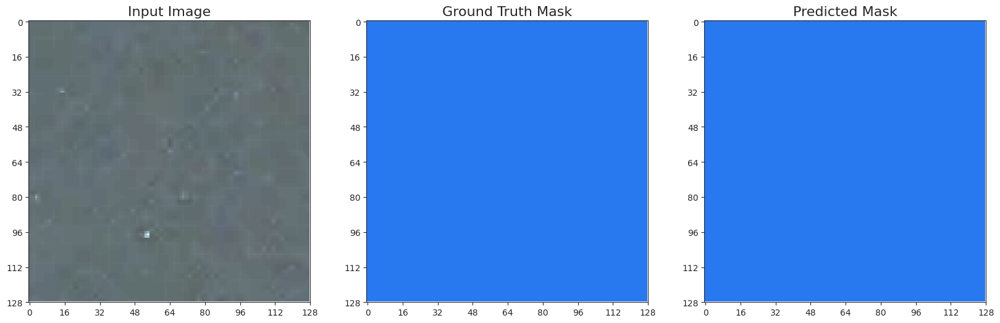

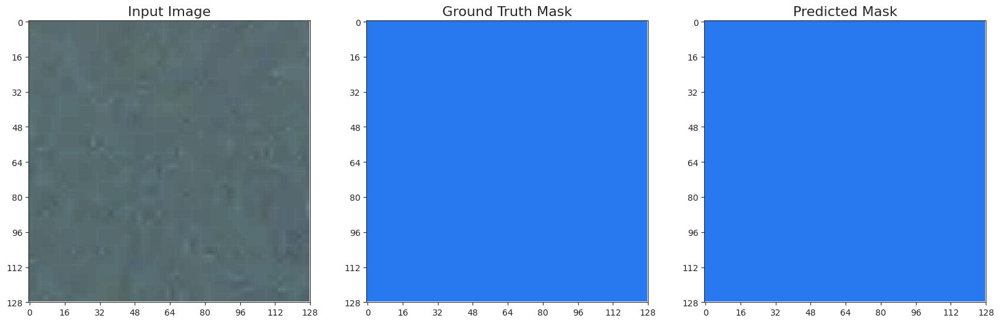

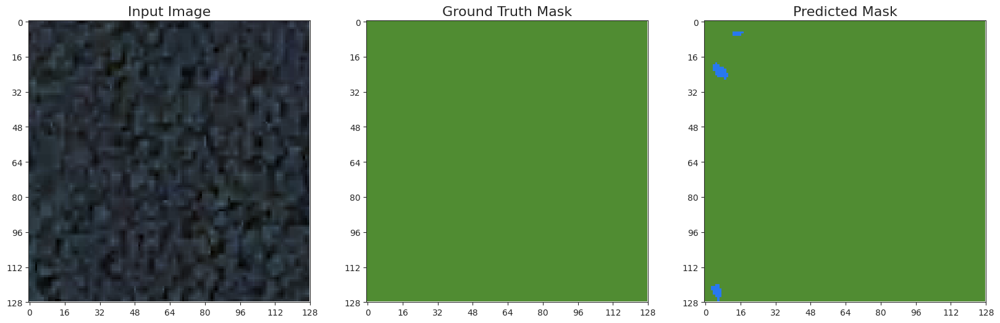

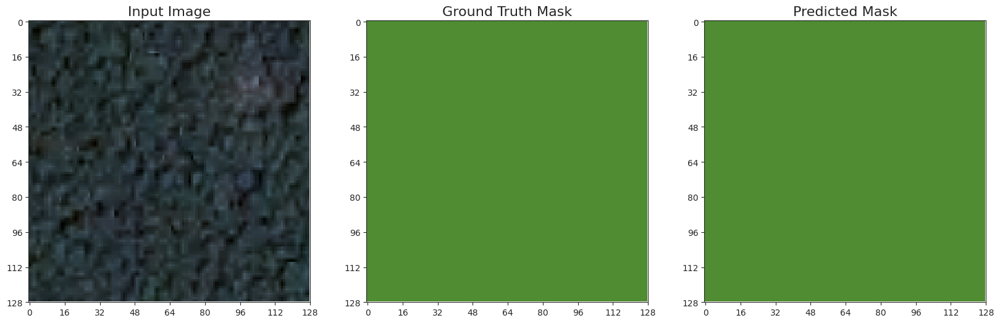

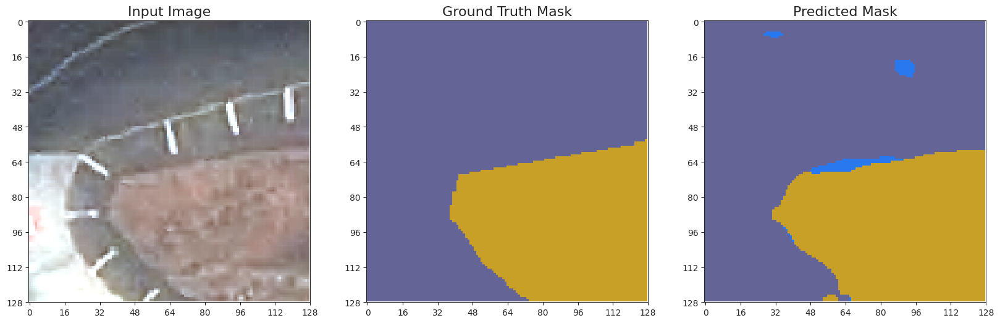

In [111]:
count = 0
for i in range(5):
    batch_img,batch_mask = next(testing_gen)
    pred_all= satgan.predict(batch_img)
    np.shape(pred_all)
    
    for j in range(0,np.shape(pred_all)[0]):
        count += 1
        fig = plt.figure(figsize=(20,8))

        ax1 = fig.add_subplot(1,3,1)
        ax1.imshow(batch_img[j])
        ax1.set_title('Input Image', fontdict={'fontsize': 16, 'fontweight': 'medium'})
        ax1.set_xticks(np.arange(0, 129, 16))
        ax1.set_yticks(np.arange(0, 129, 16))
        ax1.grid(False)

        ax2 = fig.add_subplot(1,3,2)
        ax2.set_title('Ground Truth Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
        ax2.imshow(onehot_to_rgb(batch_mask[j],id_to_code))
        ax2.set_xticks(np.arange(0, 129, 16))
        ax2.set_yticks(np.arange(0, 129, 16))
        ax2.grid(False)

        ax3 = fig.add_subplot(1,3,3)
        ax3.set_title('Predicted Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
        ax3.imshow(onehot_to_rgb(pred_all[j],id_to_code))
        ax3.set_xticks(np.arange(0, 129, 16))
        ax3.set_yticks(np.arange(0, 129, 16))
        ax3.grid(False)

        plt.savefig('/kaggle/working/Pix2pix_gan/satgan_pred{}.png'.format(count), facecolor= 'w', transparent= False, bbox_inches= 'tight', dpi= 200)
        plt.show()

# GAN